# CloudSplaining in AWS Managed Policies (camp)

## Load CSV file into a Panda

In [7]:
import pandas as pd
import datetime

pd = pd.read_csv('data/versions_summary.csv')
pd['CreateDate'] = pd['CreateDate'].apply(lambda x: datetime.datetime.fromisoformat(x))
pd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2031 entries, 0 to 2030
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   PolicyName                  2031 non-null   object             
 1   VersionId                   2031 non-null   object             
 2   IsDefaultVersion            2031 non-null   bool               
 3   CreateDate                  2031 non-null   datetime64[ns, UTC]
 4   ServiceWildcard             2031 non-null   int64              
 5   ServicesAffected            2031 non-null   int64              
 6   PrivilegeEscalation         2031 non-null   int64              
 7   ResourceExposure            2031 non-null   int64              
 8   DataExfiltration            2031 non-null   int64              
 9   CredentialsExposure         2031 non-null   int64              
 10  InfrastructureModification  2031 non-null   int64           

Let's try some graphics:

/Users/asieira/.virtualenvs/camp/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:328: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


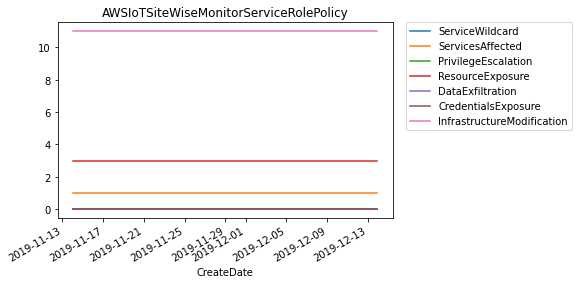

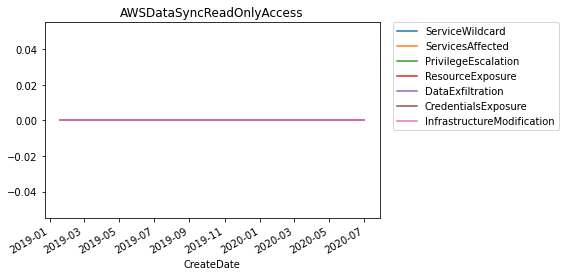

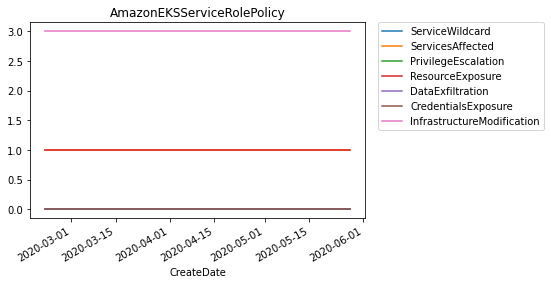

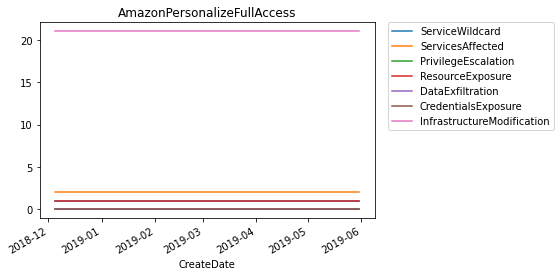

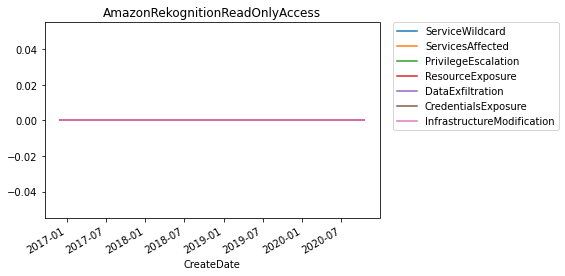

...

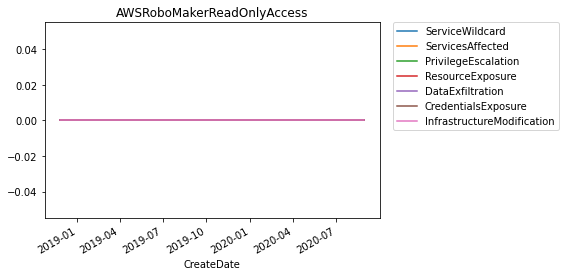

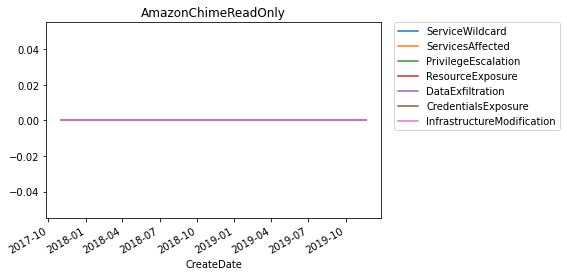

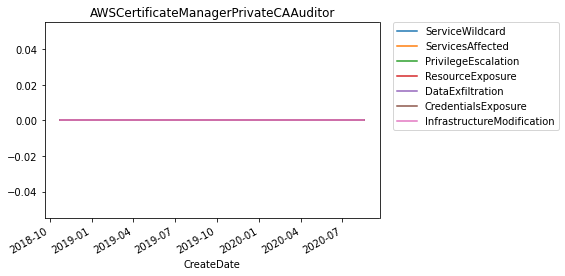

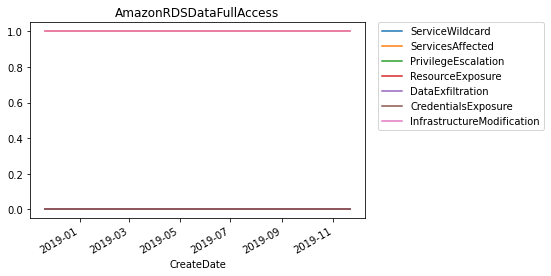

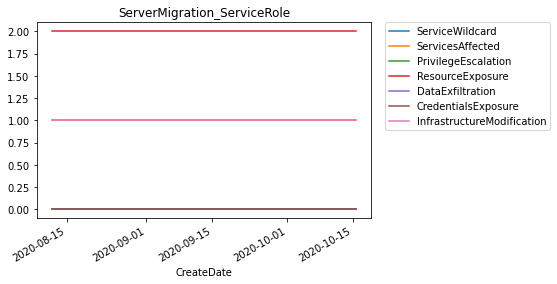

In [20]:
for policy in pd['PolicyName'].drop_duplicates():
    sub_pd = pd[(pd['PolicyName'] == policy)]
    del sub_pd['IsDefaultVersion']
    del sub_pd['PolicyName']
    if sub_pd.shape[0] <= 1:
        continue
    sub_pd.plot(kind='line', title=policy, x='CreateDate').legend(bbox_to_anchor=(1.04,1), borderaxespad=0)
    del sub_pd